In [1]:
import os
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from tqdm import tqdm
from utils import RandomFlip

np.random.seed(1234)

In [2]:
TEST_PREDICTIONS_FILENAME = "runs/model_flip_greyscale_test_predictions.pkl"
NUM_IMAGES_TO_SHOW = 16
NUM_COLS = 4
NUM_ROWS = NUM_IMAGES_TO_SHOW // NUM_COLS + int(NUM_IMAGES_TO_SHOW % NUM_COLS != 0)

In [3]:
def draw_landmarks(image, landmarks):
    for point in landmarks:
        x, y = point.astype(np.int)
        cv2.circle(image, (x, y), 1, (128, 0, 128), 1, -1)
    return image

In [16]:
with open(TEST_PREDICTIONS_FILENAME, "rb") as fp:
    results = pickle.load(fp)
image_names = results["image_names"]
landmarks = results["landmarks"]

print("Images:", len(image_names))
print("Landmarks shape:", landmarks.shape)

if len(image_names) < NUM_IMAGES_TO_SHOW:
    raise RuntimeError(f"Choose less images to show, you have only {len(image_names)}")

Images: 16000
Landmarks shape: (16000, 971, 2)


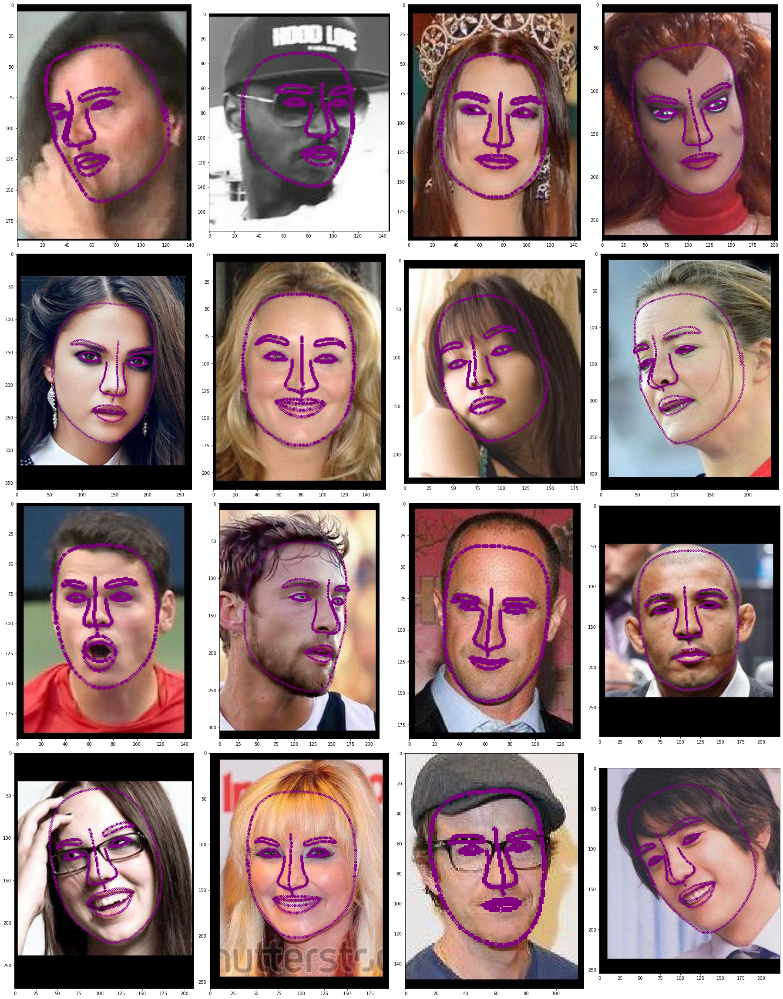

In [17]:
random_idxs = np.random.choice(len(image_names), size=min(NUM_IMAGES_TO_SHOW, len(image_names)), replace=False)

plt.figure(figsize=(25, NUM_ROWS * 8))
for i, idx in enumerate(random_idxs, 1):
    image = cv2.imread(image_names[idx])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = draw_landmarks(image, landmarks[idx])
    
    plt.subplot(NUM_ROWS, NUM_COLS, i)
    plt.imshow(image)

plt.tight_layout()
plt.show()

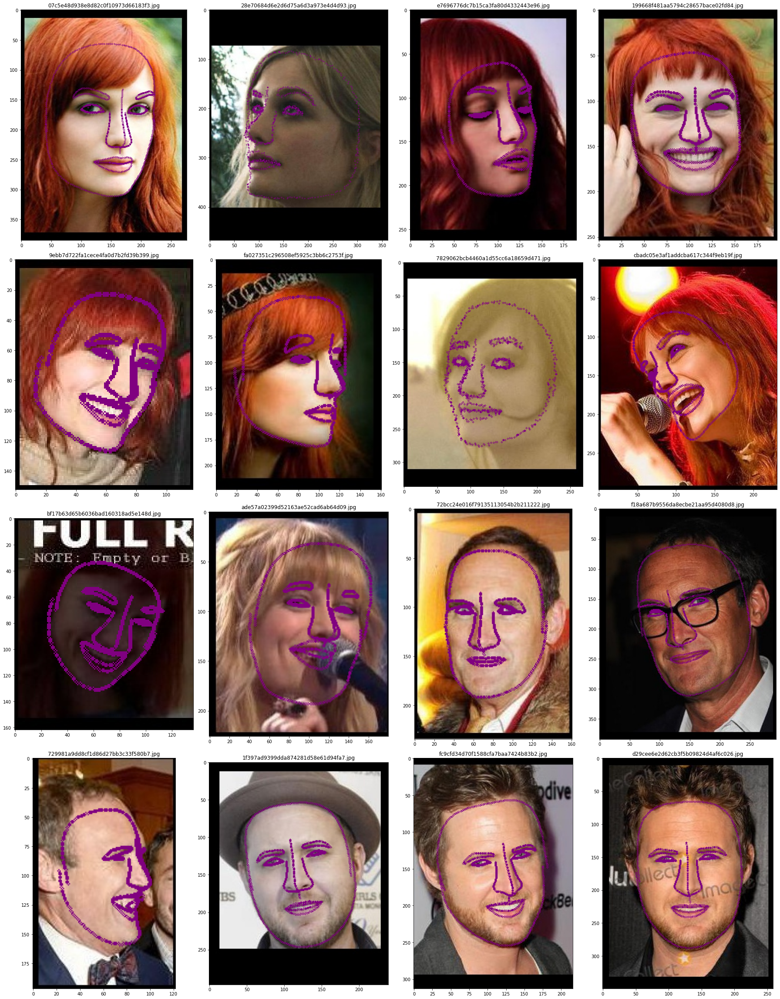

In [11]:
def landmarks_to_points(inp: list) -> list:
    points = zip(inp[0::2], inp[1::2])
    points = map(np.array, points)
    return list(points)


LANDMARKS_PATH = "data/train/landmarks.csv"
IMAGE_PATH = "data/train/images"

landmarks_df = pd.read_csv(LANDMARKS_PATH, sep='\t')
image_names_lst = landmarks_df['file_name']
landmarks_df.drop('file_name', axis=1, inplace=True)

plt.figure(figsize=(25, NUM_ROWS * 8))
for idx in landmarks_df.index:
    img_name = image_names_lst[idx]
    img_path = os.path.join(IMAGE_PATH, img_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    points_lst = landmarks_to_points(landmarks_df.loc[idx, :])
    image = draw_landmarks(image, points_lst)
    
    plt.subplot(NUM_ROWS, NUM_COLS, idx + 1)
    plt.title(img_name)
    plt.imshow(image)

    if idx > 14:
        break

plt.tight_layout()
plt.show()

In [12]:
LANDMARKS_PATH = "data/train/landmarks.csv"
IMAGE_PATH = "data/train/images"


landmarks_df = pd.read_csv(LANDMARKS_PATH, sep='\t')
image_names_lst = landmarks_df['file_name']
landmarks_df.drop('file_name', axis=1, inplace=True)
img_less_128_lst = []
img_less_256_lst = []
img_all_less_128_lst = []
img_all_less_256_lst = []

for idx, img_name in enumerate(tqdm(image_names_lst)):
    img_path = os.path.join(IMAGE_PATH, img_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # print(image.shape)
    if image.shape[0] < 128 or image.shape[1] < 128:
        img_less_128_lst.append(img_name)
    if image.shape[0] < 256 or image.shape[1] < 256:
        img_less_256_lst.append(img_name)
    if image.shape[0] < 128 and image.shape[1] < 128:
        img_all_less_128_lst.append(img_name)
    if image.shape[0] < 256 and image.shape[1] < 256:
        img_all_less_256_lst.append(img_name)

print(f'Less 128 cnt: {len(img_less_128_lst)}')
print(f'Less 256 cnt: {len(img_less_256_lst)}')
print(f'All less 128 cnt: {len(img_all_less_128_lst)}')
print(f'All less 256 cnt: {len(img_all_less_256_lst)}')

100%|██████████| 64000/64000 [41:35<00:00, 25.65it/s]  

Less 128 cnt: 10155
Less 256 cnt: 46502
All less 128 cnt: 166
All less 256 cnt: 32667


In [13]:
print(f'Less 128 cnt: {len(img_less_128_lst)}')
print(f'Less 256 cnt: {len(img_less_256_lst)}')
print(f'All less 128 cnt: {len(img_all_less_128_lst)}')
print(f'All less 256 cnt: {len(img_all_less_256_lst)}')

Less 128 cnt: 10155
Less 256 cnt: 46502
All less 128 cnt: 166
All less 256 cnt: 32667
